<a href="https://colab.research.google.com/github/Snake-identifier/MobileNetV2-model/blob/main/SnakeDL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms, datasets, models
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
class MobileNetV3_Small(nn.Module):
  def __init__(self,):
    super(MobileNetV3_Small,self).__init__()


In [ ]:
dataset_root = '/content/drive/MyDrive/Colab Notebooks/data set/data set/high venomous'

In [ ]:
# Hyper-parameters
num_epochs = 10
batch_size = 6
learning_rate = 0.001

In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((240, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((240, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(root=dataset_root, transform=train_transform)
test_dataset = torchvision.datasets.ImageFolder(root=dataset_root, transform=test_transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [ ]:
# train_dataset
test_dataset

Dataset ImageFolder
    Number of datapoints: 1160
    Root location: /content/drive/MyDrive/Colab Notebooks/data set/data set/high venomous
    StandardTransform
Transform: Compose(
               Resize(size=(240, 224), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [ ]:
class_names = train_dataset.classes
print(class_names)

['Cobra', 'Common Krait', 'Russell’s Viper', 'hump - nosed pit viper', 'krait Bungarus ceylonicus', 'non venomous', 'saw- scaled viper']


In [ ]:
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

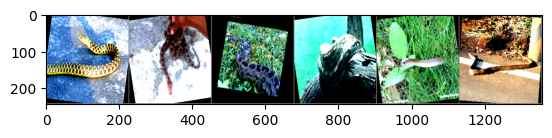

In [ ]:
# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))

In [ ]:
import time
import os
import copy

In [ ]:
import torch.optim as optim
from torch.optim import lr_scheduler

# test function

In [ ]:
# def train_model(model, criterion, optimizer, scheduler, num_epochs=2):
#     since = time.time()

#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0

#     for epoch in range(num_epochs):
#         print('Epoch {}/{}'.format(epoch, num_epochs - 1))
#         print('-' * 10)

#         # Each epoch has a training and validation phase
#         for phase in [train_dataset, test_dataset]:
#             if phase == 'train_dataset':
#                 model.train()  # Set model to training mode
#             else:
#                 model.eval()   # Set model to evaluate mode

#             running_loss = 0.0
#             running_corrects = 0

#             # Iterate over data.
#             for inputs, labels in [train_dataset, test_dataset]:
#                 inputs = inputs.to()
#                 labels = labels.to()

#                 # forward
#                 # track history if only in train
#                 with torch.set_grad_enabled(phase == 'train'):
#                     outputs = model(inputs)
#                     _, preds = torch.max(outputs, 1)
#                     loss = criterion(outputs, labels)

#                     # backward + optimize only if in training phase
#                     if phase == 'train':
#                         optimizer.zero_grad()
#                         loss.backward()
#                         optimizer.step()

#                 # statistics
#                 running_loss += loss.item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             if phase == 'train':
#                 scheduler.step()

#             epoch_loss = running_loss / dataset_sizes[phase]
#             epoch_acc = running_corrects.double() / dataset_sizes[phase]

#             print('{} Loss: {:.4f} Acc: {:.4f}'.format(
#                 phase, epoch_loss, epoch_acc))

#             # deep copy the model
#             if phase == 'val' and epoch_acc > best_acc:
#                 best_acc = epoch_acc
#                 best_model_wts = copy.deepcopy(model.state_dict())

#         print()

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(
#         time_elapsed // 60, time_elapsed % 60))
#     print('Best val Acc: {:4f}'.format(best_acc))

#     # load best model weights
#     model.load_state_dict(best_model_wts)
#     return model

In [ ]:
# model = models.resnet50(pretrained=True)
# num_ftrs = model.fc.in_features
# # Here the size of each output sample is set to 2.
# # Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
# model.fc = nn.Linear(num_ftrs, 2)

In [ ]:
# model = model.to()
# criterion = nn.CrossEntropyLoss()

In [ ]:
# # Observe that all parameters are being optimized
# optimizer = optim.SGD(model.parameters(), lr=0.001)

 StepLR Decays the learning rate of each parameter group by gamma every step_size epochs

 Decay LR by a factor of 0.1 every 7 epochs

 Learning rate scheduling should be applied after optimizer’s update

 e.g., you should write your code this way:

```
 for epoch in range(100):
     train(...)
     validate(...)
     scheduler.step()
```




In [ ]:
# step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# model = train_model(model, criterion, optimizer, step_lr_scheduler, num_epochs=25)

# gpt result test

In [ ]:
# Load pretrained MobileNetV2
mobilenet_v2 = models.mobilenet_v2(weights=True)
num_ftrs = mobilenet_v2.classifier[1].in_features
mobilenet_v2.classifier = nn.Linear(num_ftrs, len(train_dataset.classes))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(mobilenet_v2.parameters(), lr=learning_rate)

In [ ]:
train_losses = []
validation_losses = []
# Lists to store training and validation accuracies
train_accuracies = []
validation_accuracies = []

In [ ]:
# for epoch in range(num_epochs):
#     mobilenet_v2.train()
#     running_loss = 0.0
#     for i, (inputs, labels) in enumerate(train_loader, 0):
#         optimizer.zero_grad()
#         outputs = mobilenet_v2(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()
#         running_loss += loss.item()
#         # print(f"Epoch {epoch + 1}, Batch {i + 1} | i: {i} | running_loss: {running_loss}")  # Debugging statement
#         if i % 10 == 9:  # Print every 100 mini-batches
#           print(f'Epoch [{epoch + 1}/{num_epochs}], Batch [{i + 1}/{len(train_loader)}], Loss: {running_loss / 100:.4f}')
#           running_loss = 0.0

# print('Finished Training')
# Define optimizer and learning rate scheduler
optimizer = optim.SGD(mobilenet_v2.parameters(), lr=learning_rate)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.2)  # Reduce learning rate every 2 epochs

# Training loop
for epoch in range(num_epochs):
    mobilenet_v2.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for i, (inputs, labels) in enumerate(train_loader, 0):
        optimizer.zero_grad()
        outputs = mobilenet_v2(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted_train = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted_train == labels).sum().item()

        if i % 100 == 99:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Batch [{i + 1}/{len(train_loader)}], Loss: {running_loss / 10:.4f}')
            running_loss = 0.0

    scheduler.step()  # Update learning rate
    mobilenet_v2.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = mobilenet_v2(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted_val = torch.max(outputs.data, 1)
            total_val += labels.size(0)
            correct_val += (predicted_val == labels).sum().item()
    val_loss /= len(test_loader)
    train_losses.append(running_loss / len(train_loader))
    validation_losses.append(val_loss)

    val_accuracy = 100 * correct_val / total_val
    train_accuracies.append(100 * correct_train / total_train)
    validation_accuracies.append(val_accuracy)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Validation Accuracy: {val_accuracy:.2f}%')

print('Finished Training')

Epoch [1/10], Batch [100/194], Loss: 14.8793
Epoch [1/10], Validation Accuracy: 62.24%
Epoch [2/10], Batch [100/194], Loss: 12.0457
Epoch [2/10], Validation Accuracy: 71.29%
Epoch [3/10], Batch [100/194], Loss: 10.0475
Epoch [3/10], Validation Accuracy: 78.62%
Epoch [4/10], Batch [100/194], Loss: 8.7035
Epoch [4/10], Validation Accuracy: 80.09%
Epoch [5/10], Batch [100/194], Loss: 8.0604
Epoch [5/10], Validation Accuracy: 81.64%
Epoch [6/10], Batch [100/194], Loss: 8.0288
Epoch [6/10], Validation Accuracy: 82.24%
Epoch [7/10], Batch [100/194], Loss: 7.5778
Epoch [7/10], Validation Accuracy: 81.47%
Epoch [8/10], Batch [100/194], Loss: 7.2406
Epoch [8/10], Validation Accuracy: 81.72%
Epoch [9/10], Batch [100/194], Loss: 7.5783
Epoch [9/10], Validation Accuracy: 82.50%
Epoch [10/10], Batch [100/194], Loss: 7.7603
Epoch [10/10], Validation Accuracy: 82.67%
Finished Training




```
Epoch [1/4], Batch [100/290], Loss: 15.1620
Epoch [1/4], Batch [200/290], Loss: 12.7998
Epoch [1/4], Validation Accuracy: 71.03%
Epoch [2/4], Batch [100/290], Loss: 11.2353
Epoch [2/4], Batch [200/290], Loss: 10.2914
Epoch [2/4], Validation Accuracy: 80.00%
Epoch [3/4], Batch [100/290], Loss: 9.3069
Epoch [3/4], Batch [200/290], Loss: 8.7889
Epoch [3/4], Validation Accuracy: 81.55%
Epoch [4/4], Batch [100/290], Loss: 8.4138
Epoch [4/4], Batch [200/290], Loss: 7.8939
Epoch [4/4], Validation Accuracy: 83.02%
Finished Training
```


---



```
Epoch [1/4], Batch [100/290], Loss: 14.7456
Epoch [1/4], Batch [200/290], Loss: 13.1768
Epoch [1/4], Validation Accuracy: 64.74%
Epoch [2/4], Batch [100/290], Loss: 11.5705
Epoch [2/4], Batch [200/290], Loss: 11.1392
Epoch [2/4], Validation Accuracy: 79.14%
Epoch [3/4], Batch [100/290], Loss: 9.3151
Epoch [3/4], Batch [200/290], Loss: 9.0351
Epoch [3/4], Validation Accuracy: 80.69%
Epoch [4/4], Batch [100/290], Loss: 8.3653
Epoch [4/4], Batch [200/290], Loss: 8.8504
Epoch [4/4], Validation Accuracy: 82.93%
Finished Training
```


---

# 5epoch/5batch
```
Epoch [1/5], Batch [100/232], Loss: 14.6114
Epoch [1/5], Batch [200/232], Loss: 13.9507
Epoch [1/5], Validation Accuracy: 63.36%
Epoch [2/5], Batch [100/232], Loss: 11.6526
Epoch [2/5], Batch [200/232], Loss: 10.9603
Epoch [2/5], Validation Accuracy: 74.57%
Epoch [3/5], Batch [100/232], Loss: 9.6423
Epoch [3/5], Batch [200/232], Loss: 9.9337
Epoch [3/5], Validation Accuracy: 76.64%
Epoch [4/5], Batch [100/232], Loss: 8.8014
Epoch [4/5], Batch [200/232], Loss: 8.6191
Epoch [4/5], Validation Accuracy: 80.86%
Epoch [5/5], Batch [100/232], Loss: 7.9224
Epoch [5/5], Batch [200/232], Loss: 7.9875
Epoch [5/5], Validation Accuracy: 82.16%
Finished Training
```


---

# 5epoch/6batch

```
Epoch [1/5], Batch [100/194], Loss: 14.8448
Epoch [1/5], Validation Accuracy: 59.05%
Epoch [2/5], Batch [100/194], Loss: 11.8097
Epoch [2/5], Validation Accuracy: 72.16%
Epoch [3/5], Batch [100/194], Loss: 9.8091
Epoch [3/5], Validation Accuracy: 77.16%
Epoch [4/5], Batch [100/194], Loss: 9.0745
Epoch [4/5], Validation Accuracy: 79.14%
Epoch [5/5], Batch [100/194], Loss: 8.0912
Epoch [5/5], Validation Accuracy: 80.86%
Finished Training
```



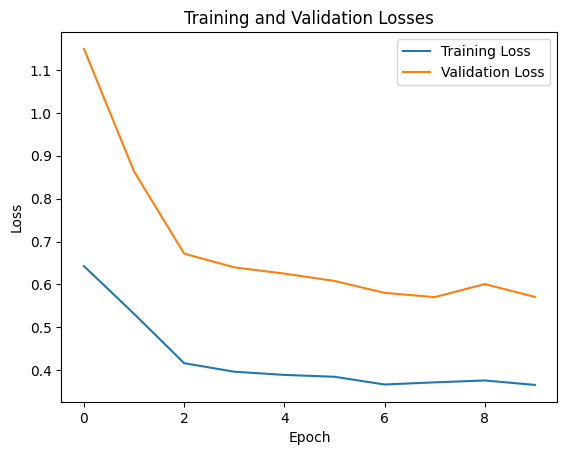

validation_losses :  0.6252083183103001
train_losses :  0.3890647622420616


In [ ]:
plt.plot(train_losses, label='Training Loss')
plt.plot(validation_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()
print("validation_losses : ",validation_losses[4])
print("train_losses : ",train_losses[4])

validation_losses :   0.5713079576476895

train_losses :   0.250580560133375


---
## 5epoch/5batch

validation_losses :  0.5750641772073919

train_losses :  0.11309653571967421


---
## 5epoch/6batch
validation_losses :  0.6412388980004591

train_losses :  0.416091223967444



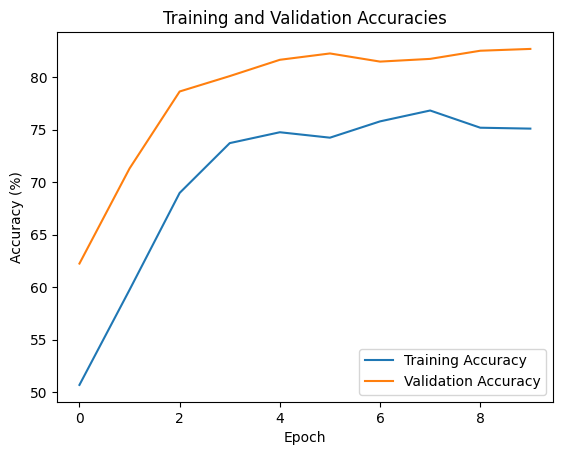

train_accuracies :  74.74137931034483
validation_accuracies :  81.63793103448276


In [ ]:
# Plot the training and validation accuracies
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(validation_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracies')
plt.legend()
plt.show()
print("train_accuracies : ",train_accuracies[4])
print("validation_accuracies : ",validation_accuracies[4])

train_accuracies :  74.3103448275862

validation_accuracies :  83.01724137931035

---
## 5epoch/5batch
train_accuracies :  71.37931034482759

validation_accuracies :  80.86206896551724

---
## 5epoch/6batch
train_accuracies :  72.5

validation_accuracies :  80.86206896551724


In [ ]:
# mobilenet_v2.eval()
# correct = 0
# total = 0
# with torch.no_grad():
#     for inputs, labels in test_loader:
#         outputs = mobilenet_v2(inputs)
#         predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()

# print(f'Accuracy on test images: {100 * correct / total:.2f}%')

# Get predictons

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
# Load the trained model
trained_model = mobilenet_v2  # Assuming you've already trained the model

In [ ]:
# Load the class labels
class_labels = train_dataset.classes

In [ ]:
def predict_image(trained_model, image_path, class_labels):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize((240, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = preprocess(image)
    input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

    # Set the model to evaluation mode
    trained_model.eval()

    # Get predictions
    with torch.no_grad():
        output = trained_model(input_batch)

    # Convert the output tensor to probabilities
    probabilities = torch.nn.functional.softmax(output[0], dim=0)

    # Get the top predicted class and its probability
    top_prob, top_class = probabilities.topk(1)

    # Print the prediction
    print(f"Predicted class: {class_labels[top_class]} with probability: {top_prob.item():.2f}")

    # Get probabilities of all classes
    all_probs = probabilities.numpy()
    for i, prob in enumerate(all_probs):
        print(f"Class: {class_labels[i]}, Probability: {prob:.2f}")

    # Display the image
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {class_labels[top_class]}")
    plt.show()


In [ ]:
class_labels = train_dataset.classes

Predicted class: non venomous with probability: 0.84
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.84
Class: saw- scaled viper, Probability: 0.09


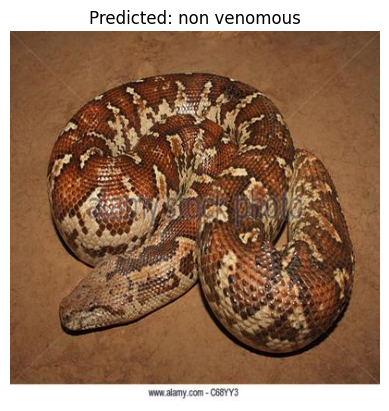

Predicted class: non venomous with probability: 0.79
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.13
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.79
Class: saw- scaled viper, Probability: 0.05


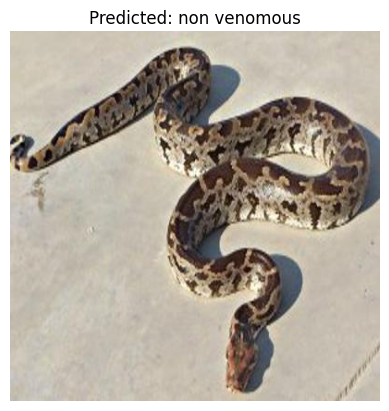

Predicted class: non venomous with probability: 0.76
Class: Cobra, Probability: 0.02
Class: Common Krait, Probability: 0.13
Class: Russell’s Viper, Probability: 0.01
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.02
Class: non venomous, Probability: 0.76
Class: saw- scaled viper, Probability: 0.02


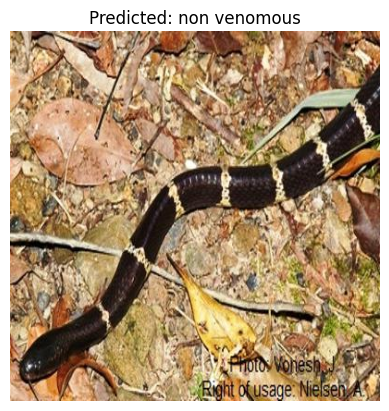

Predicted class: non venomous with probability: 0.78
Class: Cobra, Probability: 0.03
Class: Common Krait, Probability: 0.11
Class: Russell’s Viper, Probability: 0.05
Class: hump - nosed pit viper, Probability: 0.00
Class: krait Bungarus ceylonicus, Probability: 0.02
Class: non venomous, Probability: 0.78
Class: saw- scaled viper, Probability: 0.01


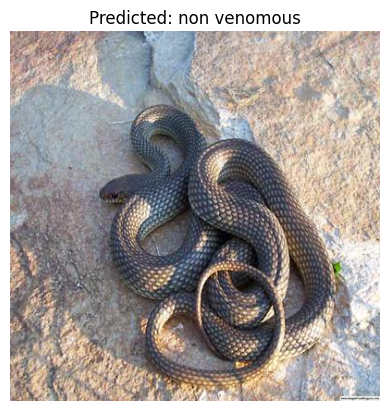

Predicted class: saw- scaled viper with probability: 0.97
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.00
Class: Russell’s Viper, Probability: 0.01
Class: hump - nosed pit viper, Probability: 0.00
Class: krait Bungarus ceylonicus, Probability: 0.00
Class: non venomous, Probability: 0.01
Class: saw- scaled viper, Probability: 0.97


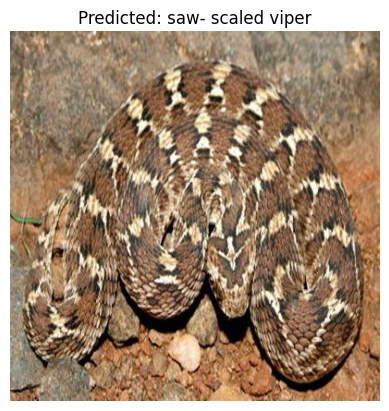

Predicted class: non venomous with probability: 0.72
Class: Cobra, Probability: 0.07
Class: Common Krait, Probability: 0.11
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.03
Class: non venomous, Probability: 0.72
Class: saw- scaled viper, Probability: 0.01


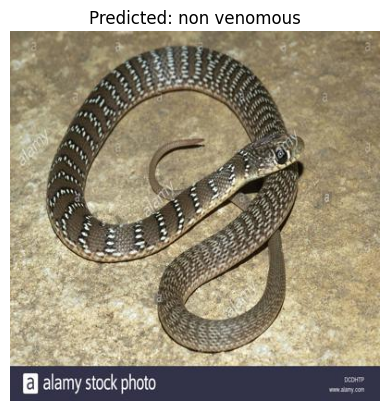

Predicted class: non venomous with probability: 0.70
Class: Cobra, Probability: 0.03
Class: Common Krait, Probability: 0.02
Class: Russell’s Viper, Probability: 0.20
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.70
Class: saw- scaled viper, Probability: 0.02


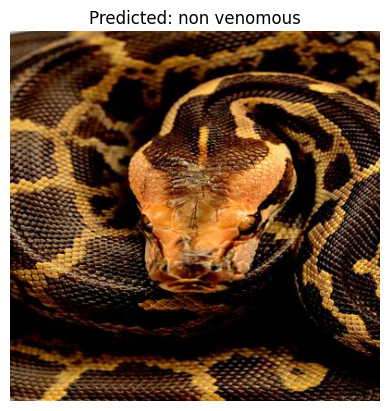

Predicted class: Common Krait with probability: 0.42
Class: Cobra, Probability: 0.07
Class: Common Krait, Probability: 0.42
Class: Russell’s Viper, Probability: 0.17
Class: hump - nosed pit viper, Probability: 0.03
Class: krait Bungarus ceylonicus, Probability: 0.11
Class: non venomous, Probability: 0.17
Class: saw- scaled viper, Probability: 0.02


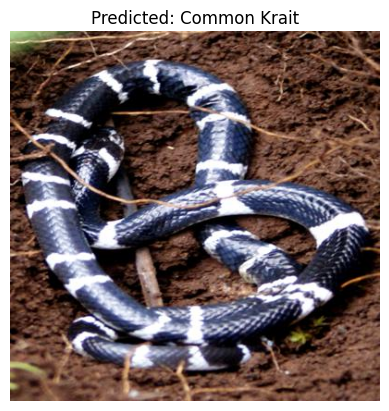

Predicted class: Common Krait with probability: 0.44
Class: Cobra, Probability: 0.15
Class: Common Krait, Probability: 0.44
Class: Russell’s Viper, Probability: 0.06
Class: hump - nosed pit viper, Probability: 0.04
Class: krait Bungarus ceylonicus, Probability: 0.19
Class: non venomous, Probability: 0.09
Class: saw- scaled viper, Probability: 0.03


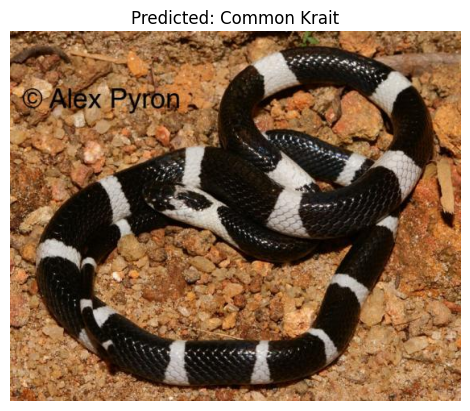

Predicted class: non venomous with probability: 0.71
Class: Cobra, Probability: 0.06
Class: Common Krait, Probability: 0.09
Class: Russell’s Viper, Probability: 0.05
Class: hump - nosed pit viper, Probability: 0.03
Class: krait Bungarus ceylonicus, Probability: 0.03
Class: non venomous, Probability: 0.71
Class: saw- scaled viper, Probability: 0.03


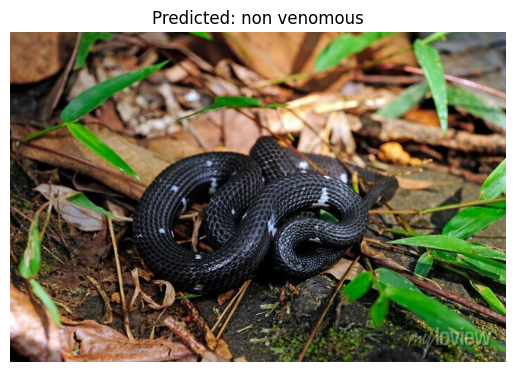

Predicted class: Russell’s Viper with probability: 0.77
Class: Cobra, Probability: 0.02
Class: Common Krait, Probability: 0.00
Class: Russell’s Viper, Probability: 0.77
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.00
Class: non venomous, Probability: 0.02
Class: saw- scaled viper, Probability: 0.16


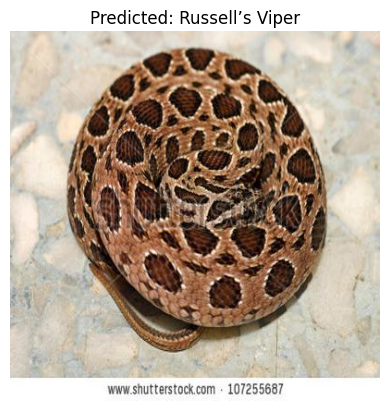

Predicted class: Common Krait with probability: 0.42
Class: Cobra, Probability: 0.08
Class: Common Krait, Probability: 0.42
Class: Russell’s Viper, Probability: 0.05
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.08
Class: non venomous, Probability: 0.35
Class: saw- scaled viper, Probability: 0.01


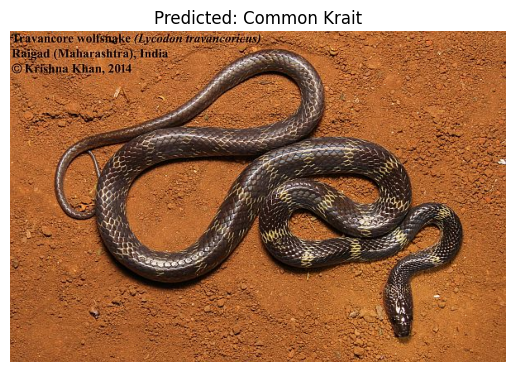

Predicted class: non venomous with probability: 0.84
Class: Cobra, Probability: 0.02
Class: Common Krait, Probability: 0.03
Class: Russell’s Viper, Probability: 0.06
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.84
Class: saw- scaled viper, Probability: 0.02


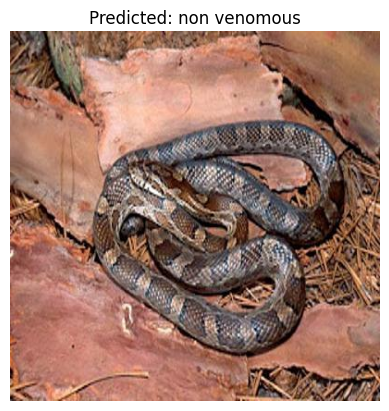

Predicted class: Russell’s Viper with probability: 0.60
Class: Cobra, Probability: 0.05
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.60
Class: hump - nosed pit viper, Probability: 0.04
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.14
Class: saw- scaled viper, Probability: 0.15


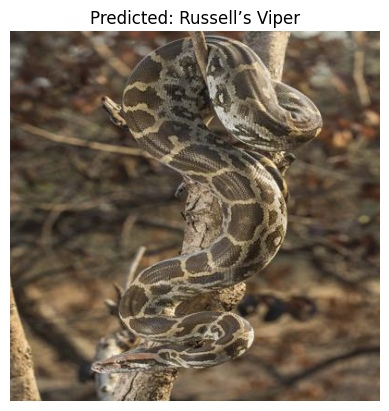

Predicted class: non venomous with probability: 0.98
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.00
Class: Russell’s Viper, Probability: 0.00
Class: hump - nosed pit viper, Probability: 0.00
Class: krait Bungarus ceylonicus, Probability: 0.00
Class: non venomous, Probability: 0.98
Class: saw- scaled viper, Probability: 0.00


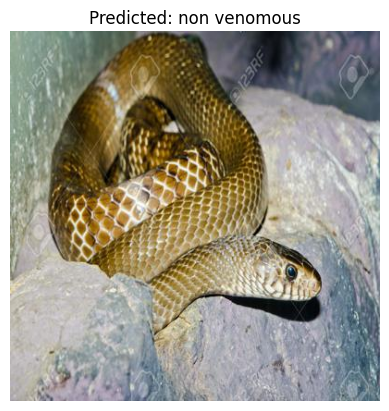

Predicted class: Common Krait with probability: 0.43
Class: Cobra, Probability: 0.29
Class: Common Krait, Probability: 0.43
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.10
Class: non venomous, Probability: 0.10
Class: saw- scaled viper, Probability: 0.02


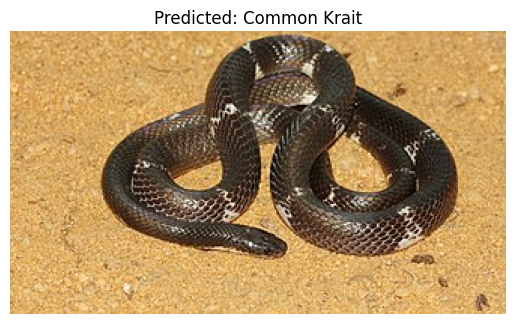

Predicted class: non venomous with probability: 0.72
Class: Cobra, Probability: 0.11
Class: Common Krait, Probability: 0.06
Class: Russell’s Viper, Probability: 0.03
Class: hump - nosed pit viper, Probability: 0.03
Class: krait Bungarus ceylonicus, Probability: 0.03
Class: non venomous, Probability: 0.72
Class: saw- scaled viper, Probability: 0.01


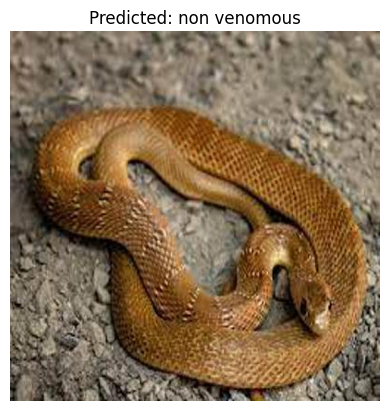

Predicted class: non venomous with probability: 0.74
Class: Cobra, Probability: 0.00
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.19
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.74
Class: saw- scaled viper, Probability: 0.04


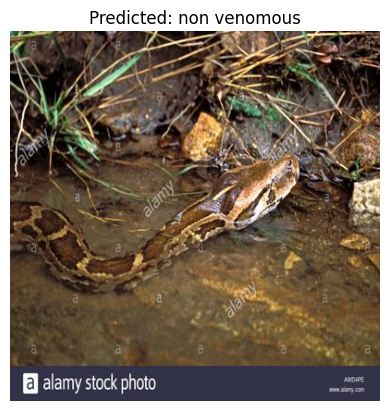

Predicted class: Common Krait with probability: 0.47
Class: Cobra, Probability: 0.04
Class: Common Krait, Probability: 0.47
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.06
Class: non venomous, Probability: 0.32
Class: saw- scaled viper, Probability: 0.05


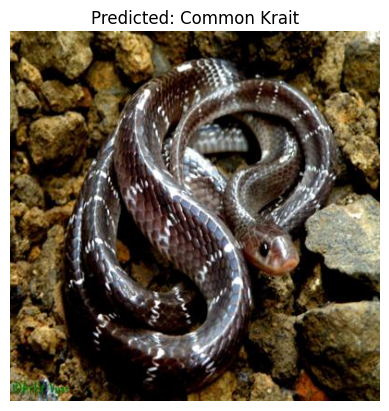

Predicted class: non venomous with probability: 0.77
Class: Cobra, Probability: 0.02
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.16
Class: hump - nosed pit viper, Probability: 0.02
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.77
Class: saw- scaled viper, Probability: 0.02


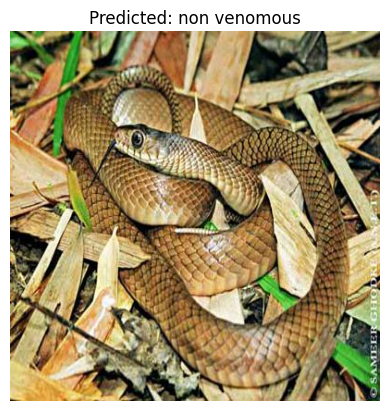

Predicted class: Cobra with probability: 0.56
Class: Cobra, Probability: 0.56
Class: Common Krait, Probability: 0.04
Class: Russell’s Viper, Probability: 0.06
Class: hump - nosed pit viper, Probability: 0.04
Class: krait Bungarus ceylonicus, Probability: 0.02
Class: non venomous, Probability: 0.25
Class: saw- scaled viper, Probability: 0.04


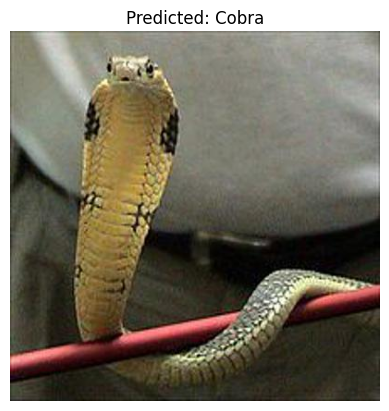

Predicted class: Common Krait with probability: 0.38
Class: Cobra, Probability: 0.14
Class: Common Krait, Probability: 0.38
Class: Russell’s Viper, Probability: 0.06
Class: hump - nosed pit viper, Probability: 0.04
Class: krait Bungarus ceylonicus, Probability: 0.14
Class: non venomous, Probability: 0.21
Class: saw- scaled viper, Probability: 0.03


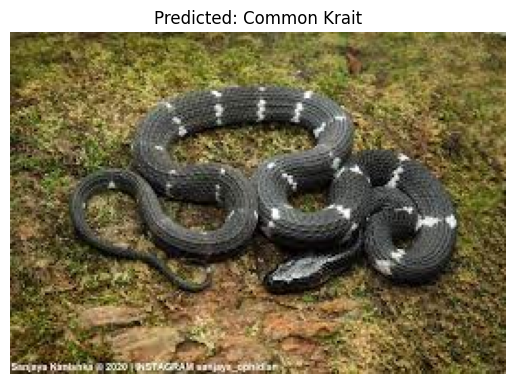

Predicted class: Common Krait with probability: 0.39
Class: Cobra, Probability: 0.17
Class: Common Krait, Probability: 0.39
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.08
Class: non venomous, Probability: 0.31
Class: saw- scaled viper, Probability: 0.01


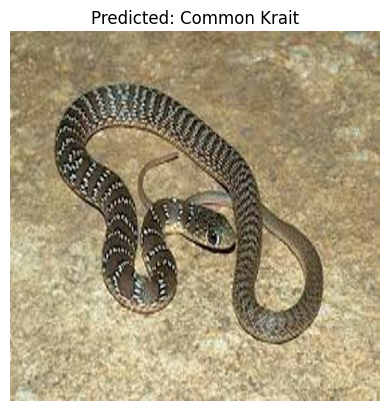

Predicted class: non venomous with probability: 0.73
Class: Cobra, Probability: 0.13
Class: Common Krait, Probability: 0.03
Class: Russell’s Viper, Probability: 0.03
Class: hump - nosed pit viper, Probability: 0.04
Class: krait Bungarus ceylonicus, Probability: 0.02
Class: non venomous, Probability: 0.73
Class: saw- scaled viper, Probability: 0.03


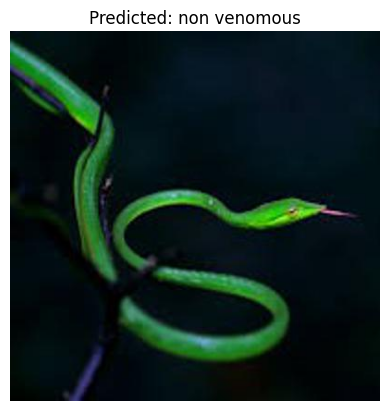

Predicted class: non venomous with probability: 0.44
Class: Cobra, Probability: 0.04
Class: Common Krait, Probability: 0.40
Class: Russell’s Viper, Probability: 0.04
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.07
Class: non venomous, Probability: 0.44
Class: saw- scaled viper, Probability: 0.01


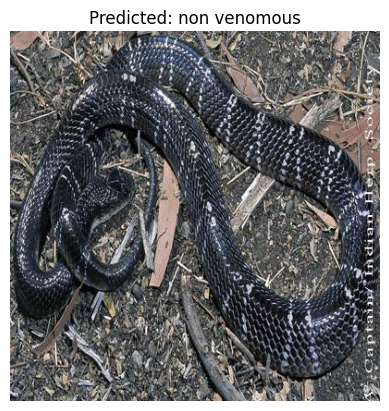

Predicted class: non venomous with probability: 0.51
Class: Cobra, Probability: 0.31
Class: Common Krait, Probability: 0.04
Class: Russell’s Viper, Probability: 0.05
Class: hump - nosed pit viper, Probability: 0.03
Class: krait Bungarus ceylonicus, Probability: 0.03
Class: non venomous, Probability: 0.51
Class: saw- scaled viper, Probability: 0.03


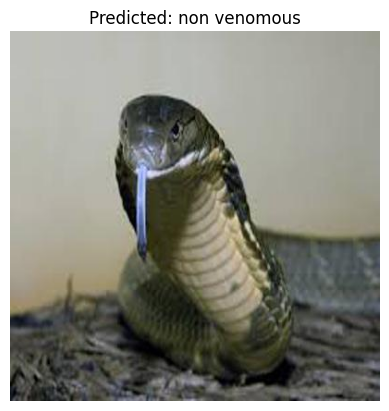

Predicted class: non venomous with probability: 0.87
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.01
Class: Russell’s Viper, Probability: 0.08
Class: hump - nosed pit viper, Probability: 0.01
Class: krait Bungarus ceylonicus, Probability: 0.01
Class: non venomous, Probability: 0.87
Class: saw- scaled viper, Probability: 0.01


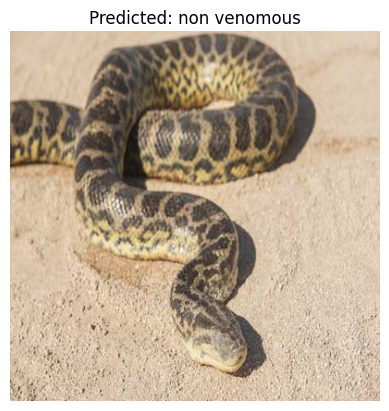

In [ ]:
test_images_folder = '/content/sample_data/snake_test'

# Loop through each image in the folder and make predictions
for image_file in os.listdir(test_images_folder):
    if image_file.endswith('.jpg') or image_file.endswith('.png'):
        image_path = os.path.join(test_images_folder, image_file)
        predict_image(trained_model, image_path, class_labels)

In [ ]:
# Load and preprocess the image
image_path = '/content/16668569-Close-up-of-Indo-Chinese-Rat-snake-Thailand--Stock-Photo.jpg'  # Path to the test image
image = Image.open(image_path).convert('RGB')
preprocess = transforms.Compose([
    transforms.Resize((240, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

FileNotFoundError: ignored

Predicted class: non venomous with probability: 0.98
Class: Cobra, Probability: 0.01
Class: Common Krait, Probability: 0.00
Class: Russell’s Viper, Probability: 0.00
Class: hump - nosed pit viper, Probability: 0.00
Class: krait Bungarus ceylonicus, Probability: 0.00
Class: non venomous, Probability: 0.98
Class: saw- scaled viper, Probability: 0.00


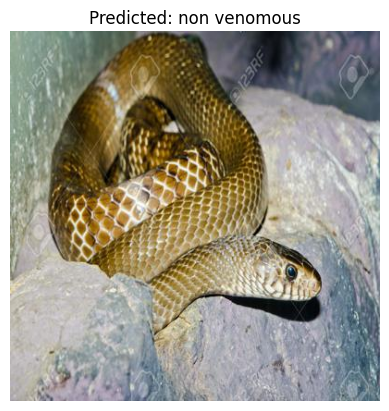

In [ ]:
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model
# Set the model to evaluation mode
trained_model.eval()
# Get predictions
with torch.no_grad():
    output = trained_model(input_batch)

# Convert the output tensor to probabilities
probabilities = torch.nn.functional.softmax(output[0], dim=0)

# Get the top predicted class and its probability
top_prob, top_class = probabilities.topk(1)

# Print the prediction
print(f"Predicted class: {class_labels[top_class]} with probability: {top_prob.item():.2f}")

# Get probabilities of all classes
all_probs = probabilities.numpy()
for i, prob in enumerate(all_probs):
    print(f"Class: {class_labels[i]}, Probability: {prob:.2f}")

# Display the image
plt.imshow(image)
plt.axis('off')
plt.title(f"Predicted: {class_labels[top_class]}")
plt.show()

In [ ]:
# torch.save(trained_model,'TrainedMobileNetV2Model.pth')